In [1]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from numpy.random import normal
from scipy import constants
from commpy.utilities import signal_power, upsample
from optic.dsp import firFilter, pulseShape, lowPassFIR
from optic.models import mzm, photodiode
from optic.plot import eyediagram
from optic.core import parameters
from numpy.fft import fft, ifft, fftshift, fftfreq

In [2]:
from IPython.core.display import HTML
from IPython.core.pylabtools import figsize
from IPython.display import display, Math

HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
figsize(10, 3)

In [4]:
%load_ext autoreload
%autoreload 2

# Optical communications

# Optical receivers e noise

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Receptores-para-sistemas-de-comunicações-ópticas" data-toc-modified-id="Receptores-para-sistemas-de-comunicações-ópticas-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Receptores para sistemas de comunicações ópticas</a></span><ul class="toc-item"><li><span><a href="#Função-de-um-receptor-óptico" data-toc-modified-id="Função-de-um-receptor-óptico-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Função de um receptor óptico</a></span></li><li><span><a href="#Receptores-para-sistemas-de-modulação-de-intensidade-e-detecção-direta" data-toc-modified-id="Receptores-para-sistemas-de-modulação-de-intensidade-e-detecção-direta-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Receptores para sistemas de modulação de intensidade e detecção direta</a></span></li></ul></li><li><span><a href="#Fontes-de-ruído-em-detectores-ópticos" data-toc-modified-id="Fontes-de-ruído-em-detectores-ópticos-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Fontes de ruído em detectores ópticos</a></span><ul class="toc-item"><li><span><a href="#Ruído-de-disparo-(ou-ruído-balístico)" data-toc-modified-id="Ruído-de-disparo-(ou-ruído-balístico)-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Ruído de disparo (ou ruído balístico)</a></span></li><li><span><a href="#Potência-do-ruído-de-disparo" data-toc-modified-id="Potência-do-ruído-de-disparo-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Potência do ruído de disparo</a></span><ul class="toc-item"><li><span><a href="#Calculando-a-potência-de-um-sinal" data-toc-modified-id="Calculando-a-potência-de-um-sinal-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Calculando a potência de um sinal</a></span></li></ul></li><li><span><a href="#Ruído-térmico" data-toc-modified-id="Ruído-térmico-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Ruído térmico</a></span></li><li><span><a href="#Potência-de-ruído-térmico" data-toc-modified-id="Potência-de-ruído-térmico-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Potência de ruído térmico</a></span></li><li><span><a href="#Razão-sinal-ruído-(signal-to-noise-ratio---SNR)" data-toc-modified-id="Razão-sinal-ruído-(signal-to-noise-ratio---SNR)-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Razão sinal-ruído (<em>signal-to-noise ratio</em> - SNR)</a></span></li><li><span><a href="#Receptores-p-i-n" data-toc-modified-id="Receptores-p-i-n-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Receptores p-i-n</a></span><ul class="toc-item"><li><span><a href="#Limite-de-ruído-térmico-$(\sigma_{T}^{2}-\gg-\sigma_{s}^{2})$" data-toc-modified-id="Limite-de-ruído-térmico-$(\sigma_{T}^{2}-\gg-\sigma_{s}^{2})$-2.6.1"><span class="toc-item-num">2.6.1&nbsp;&nbsp;</span>Limite de ruído térmico $(\sigma_{T}^{2} \gg \sigma_{s}^{2})$</a></span></li><li><span><a href="#Limite-de-ruído-de-disparo-$(\sigma_{s}^{2}-\gg-\sigma_{T}^{2})$" data-toc-modified-id="Limite-de-ruído-de-disparo-$(\sigma_{s}^{2}-\gg-\sigma_{T}^{2})$-2.6.2"><span class="toc-item-num">2.6.2&nbsp;&nbsp;</span>Limite de ruído de disparo $(\sigma_{s}^{2} \gg \sigma_{T}^{2})$</a></span></li><li><span><a href="#Parâmetros-típicos" data-toc-modified-id="Parâmetros-típicos-2.6.3"><span class="toc-item-num">2.6.3&nbsp;&nbsp;</span>Parâmetros típicos</a></span></li></ul></li><li><span><a href="#Simulando-o-transmissor-10G-OOK" data-toc-modified-id="Simulando-o-transmissor-10G-OOK-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Simulando o transmissor 10G OOK</a></span></li><li><span><a href="#Simulando-as-fontes-de-ruído-do-receptor-p-i-n" data-toc-modified-id="Simulando-as-fontes-de-ruído-do-receptor-p-i-n-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Simulando as fontes de ruído do receptor p-i-n</a></span></li><li><span><a href="#Receptores-baseados-em-APDs" data-toc-modified-id="Receptores-baseados-em-APDs-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>Receptores baseados em APDs</a></span><ul class="toc-item"><li><span><a href="#Ruído-de-disparo" data-toc-modified-id="Ruído-de-disparo-2.9.1"><span class="toc-item-num">2.9.1&nbsp;&nbsp;</span>Ruído de disparo</a></span></li></ul></li></ul></li><li><span><a href="#Sensitividade-de-receptores" data-toc-modified-id="Sensitividade-de-receptores-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Sensitividade de receptores</a></span><ul class="toc-item"><li><span><a href="#Canal-AWGN-(Additive-White-Gaussian-Noise-Channel)" data-toc-modified-id="Canal-AWGN-(Additive-White-Gaussian-Noise-Channel)-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Canal AWGN (<em>Additive White Gaussian Noise Channel</em>)</a></span></li><li><span><a href="#Filtragem-no-receptor" data-toc-modified-id="Filtragem-no-receptor-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Filtragem no receptor</a></span></li><li><span><a href="#Filtro-casado" data-toc-modified-id="Filtro-casado-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Filtro casado</a></span></li><li><span><a href="#Decisor-ótimo:-avaliando-probabilidades" data-toc-modified-id="Decisor-ótimo:-avaliando-probabilidades-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Decisor ótimo: avaliando probabilidades</a></span><ul class="toc-item"><li><span><a href="#Métrica-de-probabilidades-a-posteriori-(MP)" data-toc-modified-id="Métrica-de-probabilidades-a-posteriori-(MP)-3.4.1"><span class="toc-item-num">3.4.1&nbsp;&nbsp;</span>Métrica de <em>probabilidades a posteriori</em> (MP)</a></span></li><li><span><a href="#Limiar-de-decisão-ótimo-$I_d$" data-toc-modified-id="Limiar-de-decisão-ótimo-$I_d$-3.4.2"><span class="toc-item-num">3.4.2&nbsp;&nbsp;</span>Limiar de decisão ótimo $I_d$</a></span></li></ul></li><li><span><a href="#Probabilidade-de-erro-de-bit-$P_b$" data-toc-modified-id="Probabilidade-de-erro-de-bit-$P_b$-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Probabilidade de erro de bit $P_b$</a></span><ul class="toc-item"><li><span><a href="#Exemplo:-simulação-10G-OOK" data-toc-modified-id="Exemplo:-simulação-10G-OOK-3.5.1"><span class="toc-item-num">3.5.1&nbsp;&nbsp;</span>Exemplo: simulação 10G OOK</a></span></li></ul></li></ul></li></ul></div>

## Receivers for systems of optical communications

### Function de um optical receiver
<img src="./figuras/Rx_OOK.png" width="400">

### Receivers for systems of modulation de intensity e detecção direta
<img src="./figuras/Rx_IMDD.png" width="800">

## Fontes de noise em detectores optical

Ruídos são distorções aleatórias e indesejáveis que afetam os signals que carregam informação, dificultando ou impossibilitando o process de communication. Para analisarmos o desempenho de um dado systems de communications é necessary que todas as fontes de noise presentes no mesmo estejam caracterizadas. No caso de receivers em systems de optical communications, duas fontes de noise são importantes: o noise de disparo gerado no process de fotodetecção e o noise térmico dos components eletrônicos.

### Noise de disparo (ou noise balístico)

A corrente $I(t)$ gerada pela conversão da power de signal optical incidente no fotodiodo pode ser escrita como

$$
\begin{equation}\label{eq1}
I(t)=I_{p}(t) + i_{s}(t)
\end{equation}
$$

em que $i_{s}(t)$ representa um process aleatório conhecido como noise de disparo e $I_{p}(t)$ corresponde à corrente proporcional à responsividade e à power optical incidente no fotodiodo, data por

$$
\begin{equation}\label{eq2}
I_{p}(t)=R_{d} P_{\text {in}}(t).
\end{equation}
$$

O noise de disparo $i_{s}(t)$ é bem caracterizado como um process aleatório estacionário com estatística de Poisson que, em geral, é aproximada por uma estatística gaussiana, o que facilita o seu tratamento matemático.

Seja $R_{i_s}(\tau)$ a function de autocorrelação de $i_s(t)$ será dada por

$$
\begin{equation} \label{eq3}
R_{i_s}(\tau) = E\left[i_s(t)i_s(t+\tau)\right].
\end{equation}
$$

Pelo teorema de Wiener-Kinchin, a spectral density e power $S_{i_s}(f)$ associada a $i_s(t)$ é dada pela transformada de Fourier de $R_{i_s}(\tau)$, de mode que 

$$
\begin{align}
S_{i_s}(f)    &= \int_{-\infty}^{\infty}R_{i_s}(\tau)e^{-2\pi f \tau} d\tau\nonumber \\
R_{i_s}(\tau) &= \int_{-\infty}^{\infty}S_{i_s}(f)e^{2\pi f \tau} df\label{eq4}
\end{align}
$$

No caso do noise de disparo, a spectral density de power é constant e dada por $S_{i_s}(f)=q\bar{I}_p$, em que 
$\bar{I}_p$ é o valor médio da fotocorrente, definido por

$$
\begin{equation}\label{eq5}
\bar{I}_p = \frac{1}{T_s} \int_{-T_s/2}^{T_s/2}E[I_p(t)]dt.
\end{equation}
$$

em que $T_s$ é o período de sinalização da transmissão.

### Power do noise de disparo

A power do noise de disparo corresponderá a sua variância $\sigma_{s}^{2}$. Seja $B$ a banda do optical receiver em $\mathrm{Hz}$, $\sigma_{s}^{2}$ pode ser calculada por

$$
\begin{align}
\sigma_{s}^{2} &= E\left[i_{s}^{2}(t)\right] = R_{i_s}(0) \nonumber\\
               &= \int_{-\infty}^{\infty} S_{i_s}(f) df = \int_{-B}^{B} S_{i_s}(f) df \nonumber \\
               &= 2 q \bar{I}_{p} B \label{eq6}
\end{align}
$$

Uma vez que a corrente de escuro $I_d$ do fotodiodo (*dark current*) também contribui para o noise de disparo, a mesma deve ser incluída em (\ref{eq6}), de mode que a expressão final para a variância do noise de disparo será dada por

$$
\begin{equation}\label{eq7}
\sigma_{s}^{2} = 2 q (\bar{I}_{p} + I_d) B.
\end{equation}
$$


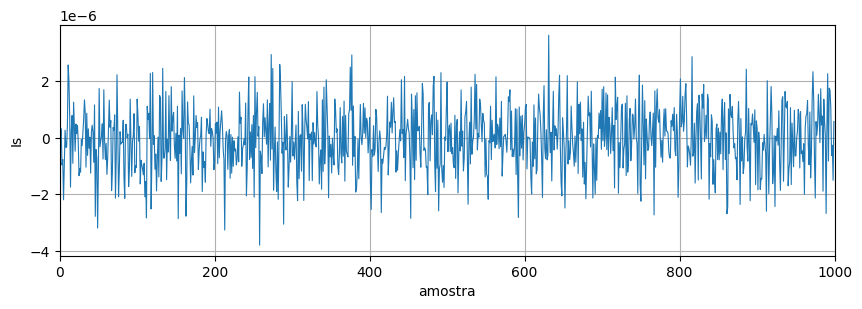

In [5]:
Pin_dBm = -1   # power optical média em dBm
Rd  = 0.5      # responsividade em A/W
Id  = 100e-9   # corrente de escuro em nA
B   = 10e9     # banda do receiver em Hz

q  = constants.value('elementary charge') # carga elementar do elétron

Pin = 10**(Pin_dBm/10)*1e-3 # power optical média em W
Ip  = Rd*Pin

# noise de disparo (noise gaussiano branco)
Namostras = 100000

σ2_s = 2*q*(Ip + Id)*B  # variância
μ    = 0                # média

σ     = np.sqrt(σ2_s) 
Is    = normal(μ, σ, Namostras)  

# plotas as primeiras 1000 amostras
plt.plot(Is[0:1000],linewidth = 0.8);
plt.xlim(0,1000)
plt.ylabel('Is')
plt.xlabel('amostra')
plt.grid()

In [6]:
# fdp de uma variable aleatória gaussiana de média μ e desvio padrão σ
def gaussian(x, μ, σ):
    return np.exp(-((x - μ)**2)/(2*σ**2))/np.sqrt(2*np.pi*σ**2)

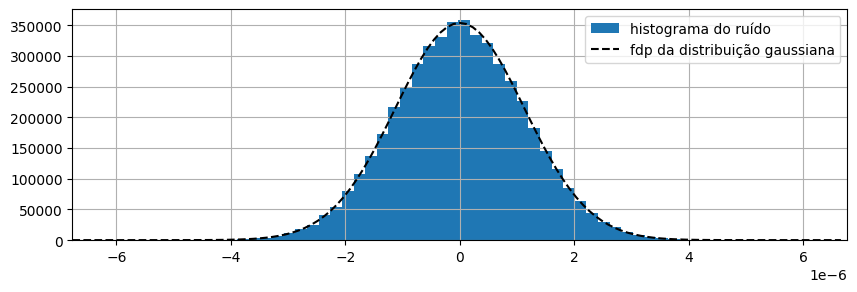

In [7]:
plt.hist(Is,51, density=True, label = 'histograma do ruído');
plt.grid()

x   = np.arange(-6*σ,6*σ, σ/10)
fdp = gaussian(x,μ,σ)

plt.plot(x,fdp,'k--',label ='fdp da distribuição gaussiana');
plt.legend();
plt.xlim(-6*σ,6*σ);

<IPython.core.display.Math object>

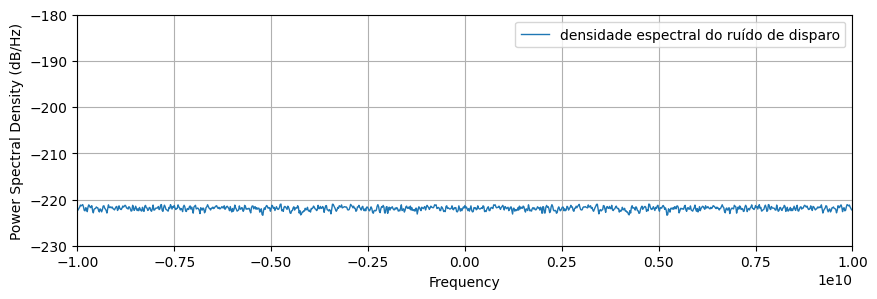

In [8]:
fa = 20e9   # frequency de amostragem considerada

plt.figure()
plt.xlim(-fa/2, fa/2)
plt.ylim(-230, -180)
plt.psd(Is, Fs=fa, label='densidade espectral do ruído de disparo',\
                   linewidth=1,  sides='twosided', NFFT=1024); # estima spectral density de power do signal
plt.legend()

display(Math('S_{i_s}(f) = %.2f \;\mathrm{dBW/Hz}'%(10*np.log10(σ2_s/(2*B)))))

#### Calculando a power de um signal

$$\begin{equation}\label{eq8}
P_x = E\left[X^2\right] = \mu^2 + \sigma^2\approx \frac{1}{N}\sum_{k=1}^{N} x^2[k]
\end{equation}
$$

In [9]:
Pn = signal_power(Is)

print('Potência do ruído (em W)   = %.2e W' %Pn) 
print('Potência do ruído (em dBm) = %.2f dBm' %(10*np.log10(Pn/1e-3))) 

Potência do ruído (em W)   = 1.28e-12 W
Potência do ruído (em dBm) = -88.92 dBm


### Noise térmico

O noise térmico tem sua origem na agitação térmica dos elétrons presentes no material que constitui um determinado device eletrônico submetido a uma dada temperatura. Desse mode, os circuitos eletrônicos que compõem o *front-end* dos receivers em systems de communication naturalmente adicionam noise térmico aos signals detectados. Portanto, num optical receiver, os circuitos microeletrônicos responsáveis por processar o signal electric obtained no process de fotodetecção também serão fontes de noise térmico.

Assim como o noise de disparo, o noise térmico tem características additivas e pode ser modelado por um process aleatório gaussiano estacionário. Logo, podemos reescrever a equação (\ref{eq1}) adicionando a component de noise térmico $i_{T}(t)$, de mode que

$$
\begin{equation}\label{eq9}
I(t)=I_{p}+i_{s}(t)+i_{T}(t)
\end{equation}
$$

A spectral density de power $S_{T}(f)$ do noise térmico é constant e independent da frequency até $\sim 1 \mathrm{THz}$ e dada por

$$
\begin{equation}\label{eq10}
S_{T}(f) =2 k_{B} T/R_{L}
\end{equation}
$$

em que $k_B$ é a constant Boltzmann, $T$ é a temperatura na escala Kelvin e $R_L$ é o resistor de carga.

### Power de noise térmico

Novamente fazendo uso das propriedades da spectral density de power, temos

$$
\begin{align}
\sigma_{T}^{2} &=E\left[ i_{T}^{2}(t)\right]\nonumber\\
               &=\int_{-\infty}^{\infty} S_{T}(f) df\nonumber\\
               &=\int_{-B}^{B} S_{T}(f) df\nonumber\\
               &=\left(4 k_{B} T / R_{L}\right) B\label{eq11}
\end{align}
$$

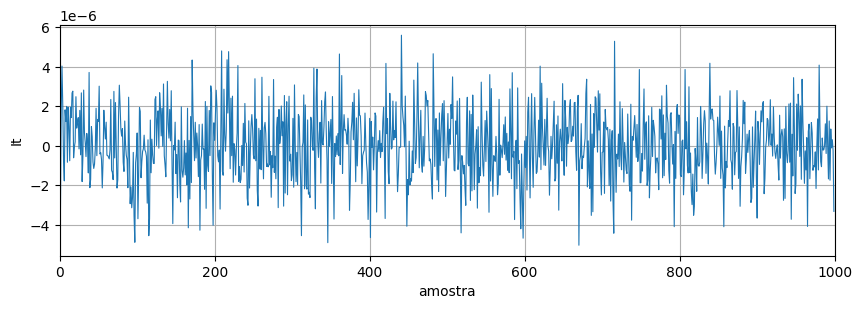

In [10]:
Tc = 25           # temperatura em Celsius
B  = 10e9         # banda do receiver
RL = 50           # RL em Ohms

T = Tc + 273.15   # temperatura em Kelvin


kB  = constants.value('Boltzmann constant')

# noise térmico (noise gaussiano branco)
Namostras = 100000

σ2_T = 4*kB*T*B/RL  # variância
μ    = 0            # média

σ     = np.sqrt(σ2_T) 
It    = normal(μ, σ, Namostras)  

# plotas as primeiras 1000 amostras
plt.plot(It[0:1000],linewidth = 0.8);
plt.xlim(0,1000)
plt.ylabel('It')
plt.xlabel('amostra')
plt.grid()

<IPython.core.display.Math object>

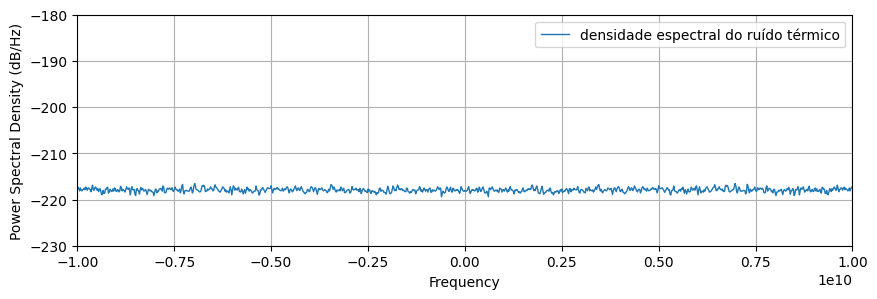

In [11]:
fa = 20e9   # frequency de amostragem considerada

plt.figure()
plt.xlim(-fa/2, fa/2)
plt.ylim(-230, -180)
plt.psd(It, Fs=fa, label='densidade espectral do ruído térmico',linewidth=1,  sides='twosided', NFFT=1024); # estima spectral density do signal
plt.legend()

display(Math('S_{i_T}(f) = %.2f \;\mathrm{dBW/Hz}'%(10*np.log10(σ2_T/(2*B)))))

In [12]:
Pn = signal_power(It)

print('Potência do ruído (em W)   = %.2e W' %Pn) 
print('Potência do ruído (em dBm) = %.2f dBm' %(10*np.log10(Pn/1e-3))) 

Potência do ruído (em W)   = 3.27e-12 W
Potência do ruído (em dBm) = -84.85 dBm


Amplificadores elétricos utilizados em optical receivers invariavelmente adicionam noise aos signals sendo amplificados. O efeito da adição de noise térmico no process de amplificação é genericamente caracterizado pelo parameter de *figure de noise* $F_n$ do device, de mode que

$$
\begin{equation}\label{eq12}
\sigma_{T}^{2}= \left(4 k_{B}T/ R_{L}\right) F_{n} B
\end{equation}
$$

O noise total $i_n(t)$ adicionado pelo receiver será dado por $i_n(t) = i_s(t) + i_T(t)$, de mode que

$$
\begin{equation}\label{eq13}
\sigma_n^{2}=E\left[I_n^{2}\right]=\sigma_{s}^{2}+\sigma_{T}^{2}=2 q\left(\bar{I}_{p}+I_{d}\right) B +\left(4 k_{B}T/ R_{L}\right) F_{n} B
\end{equation}
$$

### Razão signal-noise (*signal-to-noise ratio* - SNR)

A signal-to-noise ratio (ou razão signal-noise, *signal-to-noise ratio* (SNR), em Inglês) é uma das grandezas mais importantes na engenharia de systems de communications. A SNR é uma medida da influência do noise num dado system.

A SNR é definida como sendo a razão entre a power de signal $P_s$ e a power do noise $P_n$ observadas num dado system, ou seja

$$
\begin{equation}\label{eq14}
\mathrm{SNR} = \frac{P_s}{P_n}
\end{equation}
$$

em que $P_s = E\left[|s(t)|^2\right]$ e $P_n=E\left[|n(t)|^2\right]$.

Quando expressa em decibéis (dB), a SNR é dada por

$$ 
\begin{equation}\label{eq15}
\mathrm{SNR}_{dB} = 10\log_{10}P_s-10\log_{10}P_n.
\end{equation}
$$

Quanto greater a SNR greater a diferença entre a power do signal de interesse e a power do noise adicionado á mesma. Dessa form, quanto greater a SNR melhor a qualidade do signal.

### Receivers p-i-n

Para receivers p-i-n, considerando a presença de noise de disparo e noise térmico, temos a following expressão para a SNR do signal electric na output do fotodiodo

$$
\begin{equation}\label{eq16}
\mathrm{SNR}=\frac{R_{d}^{2} P_{i n}^{2}}{2 q\left(R_{d} P_{i n}+I_{d}\right)B + 4\left(k_{B} T / R_{L}\right) F_{n} B}.
\end{equation}
$$

#### Limite de noise térmico $(\sigma_{T}^{2} \gg \sigma_{s}^{2})$

$$
\begin{equation}\label{eq17}
\mathrm{SNR}=\frac{R_{L} R_{d}^{2} P_{\text {in }}^{2}}{4 k_{B} T F_{n} \Delta f}
\end{equation}
$$

Power equivalente de noise (*noise-equivalent power* - $\mathrm{NEP}$)

$$
\begin{equation}\label{eq18}
\mathrm{NEP}=\frac{P_{\mathrm{in}}}{\sqrt{\Delta f}}=\left(\frac{4 k_{\mathrm{B}} T F_{n}}{R_{L} R_{d}^{2}}\right)^{1 / 2}=\frac{h \nu}{\eta q}\left(\frac{4 k_{\mathrm{B}} T F_{n}}{R_{\mathrm{L}}}\right)^{1 / 2}
\end{equation}
$$

#### Limite de noise de disparo $(\sigma_{s}^{2} \gg \sigma_{T}^{2})$

$$
\begin{equation}\label{eq19}
\mathrm{SNR}=\frac{R_{d} P_{\mathrm{in}}}{2 q \Delta f}=\frac{\eta P_{\mathrm{in}}}{2 h \nu \Delta f}
\end{equation}
$$

#### Parameters típicos

$$
\begin{array}{lcclll}
\hline
\text { Parameter } & \text { Símbolo } & \text { Unidade } & \text { Si } & \text { Ge } & \text { InGaAs } \\
\hline \text { Wavelength } & \lambda & \mu \mathrm{m} & 0,4-1,1 & 0,8-1,8 & 1,0-1,7 \\
\text { Responsividade } & R_{d} & \mathrm{~A} / \mathrm{W} & 0,4-0,6 & 0,5-0,7 & 0,6-0,9 \\
\text { Eficiência quântica } & \eta & \% & 75-90 & 50-55 & 60-70 \\
\text { Corrente no escuro } & I_{d} & \mathrm{n} \mathrm{A} & 1-10 & 50-500 & 1-20 \\
\text { Time de subida } & T_{r} & \mathrm{~ns} & 0,5-1 & 0,1-0,5 & 0,02-0,5 \\
\text { Largura de banda } & \Delta f & \mathrm{GHz} & 0,3-0,6 & 0,5-3 & 1-10 \\
\text { Tensão de polarização } & V_{b} & \mathrm{~V} & 50-100 & 6-10 & 5-6 \\
\hline
\end{array}
$$
<center> Fonte: Tabela 4.1, Agrawal, Sistemas de Comunicações por Fibra Óptica, 4ª edição, 2014. </center>

### Simulating o transmitter 10G OOK

Potência média do sinal óptico modulado (mW): 0.01 mW
Potência média do sinal óptico modulado (dBm): -20.02 dBm


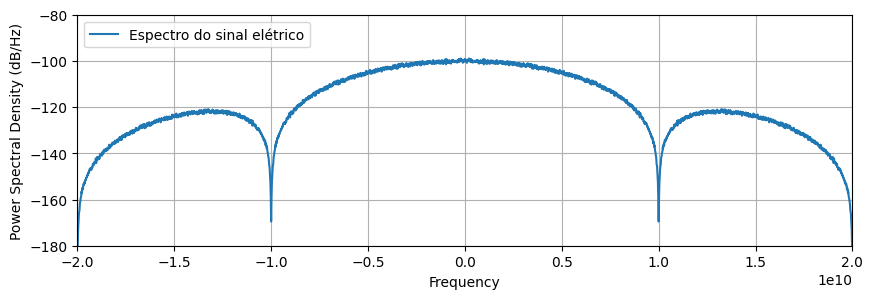

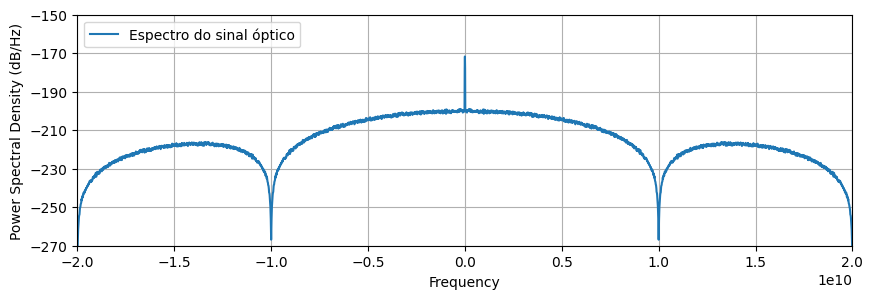

In [13]:
# parameters of the simulation
SpS = 16
Rs     = 10e9          # Symbol rate (para o caso do OOK Rs = Rb)
Ts     = 1/Rs          # Período de símbolo em segundos
Fa     = 1/(Ts/SpS)    # Frequency de amostragem do signal (amostras/second)
Ta     = 1/Fa          # Período de amostragem

Pi_dBm = -17  # power de signal optical na input do modulador em dBm

# parameters of the MZM
Vπ = 2
Vb = -Vπ/2
Pi = 10**(Pi_dBm/10)*1e-3 # power de signal optical em W na input do MZM

# gera sequência de bits pseudo-aleatórios
bits   = np.random.randint(2, size=100000)    
n      = np.arange(0, bits.size)

# mapeia bits para pulsos elétricos
symbTx = 2*bits-1
symbTx = symbTx/np.sqrt(signal_power(symbTx))

# upsampling
symbolsUp = upsample(symbTx, SpS)

# pulso NRZ típico
pulse = pulseShape('nrz', SpS)
pulse = pulse/max(abs(pulse))

# formatação de pulso
sigTx  = firFilter(pulse, symbolsUp)

# modulation optical
Ai     = np.sqrt(Pi)
sigTxo = mzm(Ai, sigTx, Vπ, Vb)

print('Potência média do sinal óptico modulado (mW): %.2f mW'%(signal_power(sigTxo)/1e-3))
print('Potência média do sinal óptico modulado (dBm): %.2f dBm'%(10*np.log10(signal_power(sigTxo)/1e-3)))

# plota psd
plt.figure();
plt.xlim(-2*Rs,2*Rs);
plt.ylim(-180,-80);
plt.psd(sigTx,Fs=Fa, NFFT = 16*1024, sides='twosided', label = 'Espectro do sinal elétrico')
plt.legend(loc='upper left');

# plota psd
plt.figure();
plt.xlim(-2*Rs,2*Rs);
plt.ylim(-270,-150);
plt.psd(np.abs(sigTxo)**2,Fs=Fa, NFFT = 16*1024, sides='twosided', label = 'Espectro do sinal óptico')
plt.legend(loc='upper left');

### Simulating as fontes de noise do receiver p-i-n

Pin[Rx] = -20.02 dBm 
SNR[teoria] = 11.50 dB 
SNR[sim] = 11.46 dB 


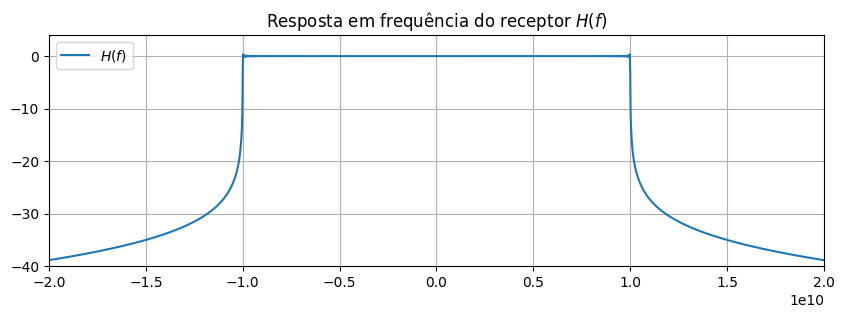

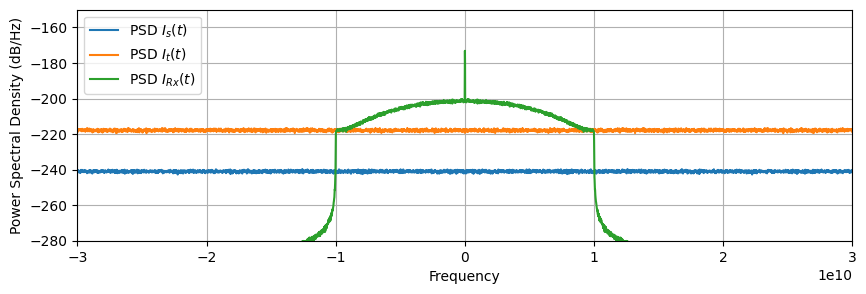

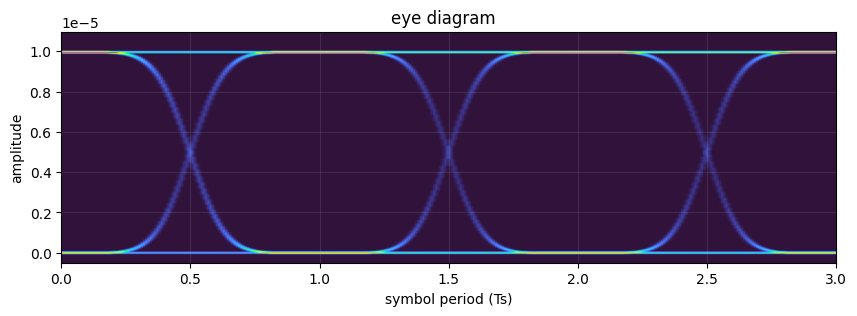

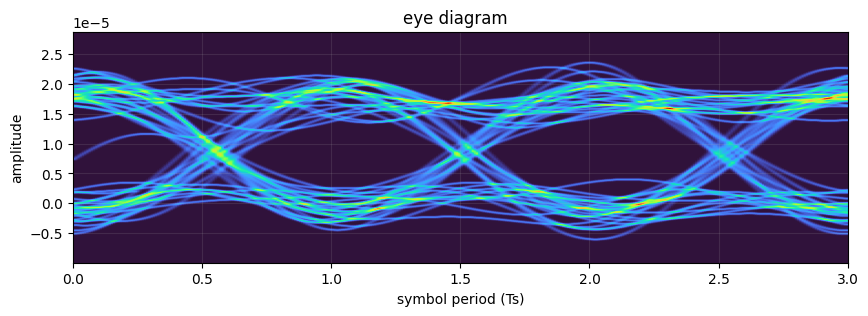

In [14]:
# parameters of the receiver
Tc = 25    # temperatura em Celsius
B  = 10e9  # banda do receiver em Hz
R  = 0.85  # responsividade em A/W
Id = 5e-9  # corrente de escuro em nA
RL = 50    # RL em Ohms
        
Pin = (np.abs(sigTxo)**2).mean() # Power optical média média recebida

# fotocorrente livre de noise
Ip = Rd*np.abs(sigTxo)**2

# noise de disparo 
σ2_s = 2*q*(Rd*Pin + Id)*B  # variância  

# noise térmico
T = Tc + 273.15     # temperatura em Kelvin
σ2_T = 4*kB*T*B/RL  # variância do noise térmico

# adiciona noise do receiver p-i-n aos signals
Is = normal(0, np.sqrt(Fa*(σ2_s/(2*B))), Ip.size)
It = normal(0, np.sqrt(Fa*(σ2_T/(2*B))), Ip.size)  

# detecta o signal com o fotodiodo pin (model implementado no OptiCommPy)
paramPD = parameters()
paramPD.R = R         # responsividade em A/W
paramPD.Tc = Tc       # temperatura em Celsius
paramPD.Id = Id       # corrente de escuro em A
paramPD.RL = RL       # RL em Ohms
paramPD.B = B         # Largura de banda Hz
paramPD.Fs = Fa 
paramPD.ideal = False
I_Rx = photodiode(sigTxo, paramPD)

# filtragem Rx
N = 8001
h = lowPassFIR(B, Fa, N, typeF='rect')

freq = fftshift(fftfreq(h.size, d=1/Fa))
plt.figure()
plt.plot(freq, 10*np.log10(np.abs(fftshift(fft(h)))),label='$H(f)$')
plt.legend(loc='upper left');
plt.xlim(-2*Rs,2*Rs);
plt.ylim(-40,4);
plt.title('Resposta em frequência do receptor $H(f)$')
plt.grid();

# plota psds
plt.figure();
plt.xlim(-3*Rs,3*Rs);
plt.ylim(-280,-150);
plt.psd(Is, Fs=Fa, NFFT = 16*1024, sides='twosided', label = 'PSD $I_s(t)$')
plt.psd(It, Fs=Fa, NFFT = 16*1024, sides='twosided', label = 'PSD $I_t(t)$')
plt.psd(I_Rx, Fs=Fa, NFFT = 16*1024, sides='twosided', label = 'PSD $I_{Rx}(t)$')
plt.legend(loc='upper left');

# calculando a na simulation SNR
Ip_Rx  = firFilter(h, Ip)
Is_Rx  = firFilter(h, Is)
It_Rx  = firFilter(h, It)

# SNR teórica [Eq. (16)]
SNR_th  = (Ip**2).mean()/(σ2_s + σ2_T)

# SNR estimada numericamente na simulation
SNR_est = (Ip_Rx**2).mean()/(Is_Rx**2 + It_Rx**2).mean()

print('Pin[Rx] = %.2f dBm '%(10*np.log10(Pin/1e-3)))
print('SNR[teoria] = %.2f dB '%(10*np.log10(SNR_th)))
print('SNR[sim] = %.2f dB '%(10*np.log10(SNR_est)))

# diagram de olho
Nsamples = 20000*SpS
eyediagram(Ip,  Ip.size-SpS, SpS, ptype='fancy')
eyediagram(I_Rx, I_Rx.size-SpS, SpS, ptype='fancy')

### Receivers baseados em APDs

A fotocorrente gerada por um fotodiodo de avalanche (*avalanche photodiode* - APD) é dada por

$$
\begin{equation}\label{eq20}
I_{p}=M R_{d} P_{i n}=R_{\mathrm{APD}} P_{\mathrm{in}}
\end{equation}
$$

em que $R_{\mathrm{APD}} \equiv M R_{d}$ é a responsividade do APD e $M$ o fator multiplicativo associado.

#### Noise de disparo

A power de noise de disparo de um APD é dada por
$$
\begin{equation}\label{eq21}
\sigma_{s}^{2}=2 q M^{2} F_{A}\left(R_{d} P_{\mathrm{in}}+I_{d}\right) \Delta f,
\end{equation}
$$

em que $F_{A}$ é o fator de excesso de noise, dado por

$$
\begin{equation}\label{eq22}
F_{A}(M)=k_{A} M+\left(1-k_{A}\right)(2-1 / M).
\end{equation}
$$

$$
\begin{equation}\label{eq23}
\mathrm{SNR}=\frac{I_{p}^{2}}{\sigma_{s}^{2}+\sigma_{T}^{2}}=\frac{\left(M R_{d} P_{\text {in }}\right)^{2}}{2 q M^{2} F_{A}\left(R_{d} P_{\text {in }}+I_{d}\right) \Delta f+4\left(k_{B} T / R_{L}\right) F_{n} \Delta f}
\end{equation}
$$

## Sensitividade de receivers

Uma vez presente no system, o noise impõe limitations no desempenho dos receivers e, consequentemente, nas rates de transmissão que podem ser atingidas pelo system de communication.

Um dos parameters desempenho mais importantes em optical receivers digitais é a rate de erro de bits (*bit-error rate* - BER) que indica a frequency em que o circuito decisor comete um erro na identificação de um bit transmitido a partir do signal recebido. Por example, se o circuito decisor comete em média um erro a cada um milhão de bits transmitidos, temos uma $\mathrm{BER} = 1/10^6=1 \times 10^{-6}$. Os padrões adotados na engenheria de systems de optical communications geralmente requerem values de BER $< 10^{-9}$, ou $<10^{-12}$.

A BER de um dado system, por sua vez, depende dos values de SNR dos signals detectados no receiver. Como visto anteriormente, a SNR depende diretamente da power de signal optical $P_{in}$ presente na input do receiver. Um parameter comum associado a todo optical receiver é a *sensitividade*, que se refere ao smaller value de power recebida necessary para que o receiver opere com uma certa BER.


### Channel AWGN (*Additive White Gaussian Noise Channel*)

Assumindo que signal optical detectado gera um signal electric $y(t)$ que corresponde ao signal transmitido $x(t)$ somado ao signal $n(t)$, resultante da adição do noise de disparo e do noise térmico no *front-end* do receiver, temos que

$$
\begin{align}
y(t) &= x(t) + n(t)\nonumber\\
     &= \sum_k s_kp(t-kT_s) + n(t).
\end{align}
$$

Por simplicidade e sem loss de generalidade, assumimos que o signal electric $x(t)$ possui média nula.

### Filtragem no receiver

<img src="./figuras/MF.png" width="500">

Primeiramente, o signal recebido $y(t)$ deve passar por um filter de resposta ao impulso $h(t)$, cuja function é eliminar components de noise fora da banda de $x(t)$ e entregar o um signal $\hat{y}(t)$ com um maximum de SNR para o circuito decisor. Logo,

$$
\begin{align}
\hat{y}(t) &= y(t) \ast h(t)\nonumber\\
           &= \left[\sum_k s_kp(t-kT_s)\right]\ast h(t)  + n(t)\ast h(t)\nonumber\\
           &= \sum_k s_k\int_{-\infty}^{\infty}p(\tau-kT_s)h(t-\tau)d\tau  + \int_{-\infty}^{\infty}n(t)h(t-\tau)d\tau\nonumber\\
           &= \hat{x}(t)  + \hat{n}(t).
\end{align}
$$

Em seguida, o signal $\hat{y}(t)$ será amostrado nos instantes $t=kT_s$, ou seja, no meio do intervalo de sinalização, onde sua SNR é máxima. Para cada intervalo de sinalização, o circuito decisisor receberá uma amostra $\hat{y}(kT_s)$ dada por

$$
\begin{equation}
\hat{y}(kT_s) = \hat{x}(kT_s) + \hat{n}(kT_s).             
\end{equation}
$$

Dessa form, podemos agora calcular a SNR do signal $\hat{y}(kT_s)$ entregue ao circuito decisor. Para a power de signal, $P_s$, temos que

$$
\begin{align}
P_s &= E[\hat{x}(kT_s)^2] \nonumber\\
    &= E\left[ \left(s_k\int_{-\infty}^{\infty}p(\tau-kT_s)h(kT_s-\tau)d\tau\right)^2 \right] \nonumber\\
    &= E\left[s_k^2\right] \left(\int_{-\infty}^{\infty}p(\tau-kT_s)h(kT_s-\tau)d\tau\right)^2.
\end{align}
$$

Para a power do noise, $P_n$, temos 

$$
\begin{align}
P_n &= E[\hat{n}(kT_s)^2] \nonumber\\
    &= E\left[\left(\int_{-\infty}^{\infty}n(\tau)h(kT_s-\tau)d\tau\int_{-\infty}^{\infty}n(u)h(kT_s-u)du\right) \right] \nonumber\\
    &= \int_{-\infty}^{\infty}\int_{-\infty}^{\infty}E\left[n(\tau)n(u)\right]h(kT_s-\tau)h(kT_s-u)d\tau du\nonumber\\
    &= \sigma_n^2 \int_{-\infty}^{\infty}\int_{-\infty}^{\infty}\delta(\tau-u)h(kT_s-\tau)h(kT_s-u)d\tau du\nonumber\\
    &= \sigma_n^2 \int_{-\infty}^{\infty}h^2(kT_s-\tau)d\tau.
\end{align}
$$

Logo,

$$
\begin{align}
\mathrm{SNR} &= \frac{P_s}{P_n} = \frac{E[\hat{x}(kT_s)^2]}{E[\hat{n}(kT_s)^2]} \nonumber\\
             &= \frac{E\left[s_k^2\right] \left(\int_{-\infty}^{\infty}p(\tau-kT_s)h(kT_s-\tau)d\tau\right)^2}{\sigma_n^2 \int_{-\infty}^{\infty}h^2(kT_s-\tau)d\tau}
\end{align}
$$

### Filter casado

Deseja-se escolher um filter cuja resposta ao impulso $h(t)$ maximize o value da SNR em $t=kT_s$. Para tanto, observando o result da desigualdade de Cauchy–Schwarz, sejam $g_{1}(t)$ e $ g_{2}(t)$ signals de energia finita, tem-se que

$$
\begin{equation}
\left[\int_{-\infty}^{\infty} g_{1}(t) g_{2}(t) d t\right]^{2} \leq \int_{-\infty}^{\infty} g_{1}^{2}(t) d t \int_{-\infty}^{\infty} g_{2}^{2}(t) d t
\end{equation}
$$
com igualdade se, e somente se, $g_{1}(t) = C g_{2}(t)$ para qualquer constant arbritrária $C$. Temos então

$$
\begin{equation}
\frac{\left[\int_{-\infty}^{\infty} g_{1}(t) g_{2}(t) d t\right]^{2}}{\int_{-\infty}^{\infty} g_{2}^{2}(t) d t} \leq  \int_{-\infty}^{\infty} g_{1}^{2}(t) d t
\end{equation}
$$

Sejam $g_{1}(\tau)=p(\tau-kT_s)$ e $g_{2}(\tau)=h(kT_s-\tau)$, podemos escrever

$$
\begin{equation}
\frac{\left[\int_{-\infty}^{\infty} p(\tau-kT_s) h(kT_s-\tau) d \tau\right]^{2}}{\int_{-\infty}^{\infty} h^2(kT_s-\tau) d \tau} \leq  \int_{-\infty}^{\infty} p^2(\tau-kT_s) d \tau
\end{equation}
$$

Portanto, o maximum value que a SNR poderá alcançar está limitado a

$$
\begin{align}
\mathrm{SNR} &= \frac{E\left[s_k^2\right] \left(\int_{-\infty}^{\infty}p(\tau-kT_s)h(kT_s-\tau)d\tau\right)^2}{\sigma_n^2 \int_{-\infty}^{-\infty}h^2(kT_s-\tau)d\tau}\nonumber\\
             &\leq  \frac{E\left[s_k^2\right]}{\sigma_n^2} \int_{-\infty}^{\infty} p^2(\tau-kT_s) d \tau
\end{align}
$$

Além disso, o teorema de Cauchy–Schwarz nos informa que para alcançar o maximum de SNR podemos fazer $h(t)=p(-t)$. Nesse caso, diz-se que $h(t)$ é o "filter casado" ao pulso $p(t)$. Portanto, ao filtrar-se o signal recebido com um filter casado no receiver, garante-se que a SNR entregue ao circuito decisor é a máxima possible e equal a

$$
\begin{align}
\mathrm{SNR} = \frac{E\left[s_k^2\right]}{\sigma_n^2} \int_{-\infty}^{\infty} p^2(\tau-kT_s) d \tau
\end{align}
$$



### Decisor ótimo: avaliando probabilidades

A function do decisor é fornecer uma estimativa $\hat{b}_k$ do *k*-ésimo bit transmitido from $\hat{y}_k$. Diversas regras de decisão podem ser definidas.

O decisor ótimo utiliza uma regra de decisão que maximiza a probabilidade de acerto *a posteriori* ou, equivalentemente, que minimiza a probabilidade de erro *a posteriori*. Para obtenção de decisores ótimos se faz necessary caracterizar probabilisticamente o channel de communications.

#### Métrica de *probabilidades a posteriori* (MP)

De acordo com o teorema de Bayes, uma métrica proporcional à probabilidade *a posteriori* $P(b_k|\hat{y}_k)$ é dada por

$$
\begin{equation}
\mathrm{MP}(b_k|\hat{y}_k) = p(\hat{y}_k|b_k)P(b_k)
\end{equation}
$$

em que $P(b_k)$ é a probabilidade *a priori* associada ao bit $b_k$ e $p(\hat{y}_k|b_k)$ é a distribuição condicional ou *function de verossimilhança* associada ao channel de communications.

Regra de decisão: se $\mathrm{MP}(b_k=1|\hat{y}_k) > \mathrm{MP}(b_k=0|\hat{y}_k)$, então $\hat{b}_k=1$; se $\mathrm{MP}(b_k=0|\hat{y}_k) > \mathrm{MP}(b_k=1|\hat{y}_k)$, então $\hat{b}_k=0$.

Sabemos que:

$$ p(\hat{y}_k|b_k=0) = \frac{1}{\sigma_{0} \sqrt{2 \pi}} e^{-\frac{\left(\hat{y}_k-I_0\right)^{2}}{2 \sigma_0^{2}}}$$

$$ p(\hat{y}_k|b_k=1) = \frac{1}{\sigma_{1} \sqrt{2 \pi}} e^{-\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}}}$$

Logo, podemos define a razão $\Lambda$ entre MPs

$$
\begin{align}
\Lambda &= \frac{\mathrm{MP}(b_k=1, \hat{y}_k)}{\mathrm{MP}(b_k=0, \hat{y}_k)} 
         = \frac{p(\hat{y}_k|b_k=1)P(b_k=1)}{p(\hat{y}_k|b_k=0)P(b_k=0)}\\
        &= \frac{\sigma_0}{\sigma_1} \frac{P_1}{P_0} \left[\frac{e^{-\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}}}}{e^{-\frac{\left(\hat{y}_k-I_0\right)^2}{2 \sigma_0^{2}}}}\right].        
\end{align}
$$

Note que $\Lambda\geq 0$. Em function de $\Lambda$, a regra de decisão torna-se: se $\Lambda>1$, $\hat{b}_k=1$; se $\Lambda<1$, $\hat{b}_k=0$.

Aplicando o logaritmo 
$$
\begin{align}
\ln \Lambda &= \ln{\frac{\sigma_0}{\sigma_1} \frac{P_1}{P_0} \left[\frac{e^{-\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}}}}{e^{-\frac{\left(\hat{y}_k-I_0\right)^2}{2 \sigma_0^{2}}}}\right]}\\ 
            &=\ln\left[\frac{\sigma_0}{\sigma_1}\right] + \ln\left[\frac{P_1}{P_0}\right] + \ln{\left[\frac{e^{-\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}}}}{e^{-\frac{\left(\hat{y}_k-I_0\right)^2}{2 \sigma_0^{2}}}}\right]}\\
            &=\ln\left[\frac{\sigma_0}{\sigma_1}\right] + \ln\left[\frac{P_1}{P_0}\right] -\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}} +\frac{\left(\hat{y}_k-I_0\right)^2}{2 \sigma_0^{2}}
\end{align}
$$

Em function de $\ln \Lambda$, a regra de decisão torna-se: se $\ln\Lambda>0$, $\hat{b}_k=1$; se $\ln \Lambda<0$, $\hat{b}_k=0$.

Assumindo que os bits são equiprováveis, temos que $\frac{P_1}{P_0}=1$, ou seja, $\ln\left[\frac{P_1}{P_0}\right]= 0$ e também que, na practice, $\ln\left[\frac{\sigma_0}{\sigma_1}\right]\approx 0$.

$$
\begin{equation}
\ln \Lambda = -\frac{\left(\hat{y}_k-I_1\right)^{2}}{2 \sigma_1^{2}} +\frac{\left(\hat{y}_k-I_0\right)^2}{2 \sigma_0^{2}}
\end{equation}
$$

#### Limiar de decisão ótimo $I_d$

No limiar de decisão ótimo $I_d$, temos $\ln \Lambda = 0$, ou seja

$$
\begin{equation}
\frac{\left(I_d-I_1\right)^{2}}{2 \sigma_1^{2}} = \frac{\left(I_d-I_0\right)^2}{2 \sigma_0^{2}}
\end{equation}
$$

$$
\begin{equation}
\frac{|I_d-I_1|}{\sigma_1} = \frac{|I_d-I_0|}{\sigma_0}
\end{equation}
$$

Como $I_0\leq I_d \leq I_1$, temos que $|I_d-I_1|=I_1-I_d$ e $|I_d-I_0|=I_d-I_0$, e então

$$
\begin{equation}
\frac{I_1-I_d}{\sigma_1} = \frac{I_d-I_0}{\sigma_0}.
\end{equation}
$$

Finalmente, 

$$
\begin{equation}
I_d = \frac{\sigma_0I_1 + \sigma_1I_0}{\sigma_0 + \sigma_1}.
\end{equation}
$$

Em function de do limiar de decisão ótimo $I_d$, a regra de decisão ótima torna-se: se $\hat{y}_k>I_d$, $\hat{b}_k=1$; se $\hat{y}_k<I_d$, $\hat{b}_k=0$.

### Probabilidade de erro de bit $P_b$

A probabilidade de erro de bit é definida como sendo a probabilidade do bit $\hat{b}_k$ estimado pelo decisor ser different do transmitido $b_k$.

$$
\begin{align}
P_b &= P(\hat{b}_k=0, b_k=1) + P(\hat{b}_k=1, b_k=0) \nonumber\\
    &= P(\hat{b}_k=0 | b_k=1)P(b_k=1) + P(\hat{b}_k=1 | b_k=0)P(b_k=0) \nonumber\\
    &= P(\hat{y}_k < I_d | b_k=1)P(b_k=1) + P(\hat{y}_k > I_d | b_k=0)P(b_k=0)
\end{align}
$$

$$
\begin{align}
&P(\hat{y}_k < I_d | b_k=1)&=\frac{1}{\sigma_{1} \sqrt{2 \pi}} \int_{-\infty}^{I_d} \exp \left(-\frac{\left(\hat{y}_k-I_{1}\right)^{2}}{2 \sigma_{1}^{2}}\right) d\hat{y}_k=\frac{1}{2} \operatorname{erfc}\left(\frac{I_{1}-I_d}{\sigma_{1} \sqrt{2}}\right) \\
&P(\hat{y}_k > I_d| b_k=0)&=\frac{1}{\sigma_{0} \sqrt{2 \pi}} \int_{I_d}^{\infty} \exp \left(-\frac{\left(\hat{y}_k-I_{0}\right)^{2}}{2 \sigma_{0}^{2}}\right) d \hat{y}_k=\frac{1}{2} \operatorname{erfc}\left(\frac{I_d-I_{0}}{\sigma_{0} \sqrt{2}}\right)
\end{align}
$$

em que $\operatorname{erfc}(x)$ é a function erro complementar, definida por

$$
\begin{equation}
\operatorname{erfc}(x)=\frac{2}{\sqrt{\pi}} \int_{x}^{\infty} \exp \left(-\gamma^{2}\right) d \gamma.
\end{equation}
$$

Sejam $P(b_k=0) = P(b_k=1) = 0.5$, temos

$$
\begin{equation}
P_b=\frac{1}{4}\left[\operatorname{erfc}\left(\frac{I_{1}-I_{D}}{\sigma_{1} \sqrt{2}}\right)+\operatorname{erfc}\left(\frac{I_{D}-I_{0}}{\sigma_{0} \sqrt{2}}\right)\right]
\end{equation}
$$

Encontramos uma expressão mais conveniente para $P_b$ em function do parameter $Q$, definido por

$$
\begin{equation}
Q \equiv \frac{I_1-I_d}{\sigma_1} = \frac{I_d-I_0}{\sigma_0}.
\end{equation}
$$

Substituindo $I_d = (\sigma_0I_1 + \sigma_1I_0)/(\sigma_0 + \sigma_1)$, temos 

$$
\begin{equation}
Q \equiv \frac{I_1-I_0}{\sigma_0 + \sigma_1},
\end{equation}
$$

e 

$$
\begin{equation}
P_b=\frac{1}{2} \operatorname{erfc}\left(\frac{Q}{\sqrt{2}}\right) \approx \frac{\exp \left(-Q^{2} / 2\right)}{Q \sqrt{2 \pi}}
\end{equation}
$$

In [15]:
from scipy.special import erfc

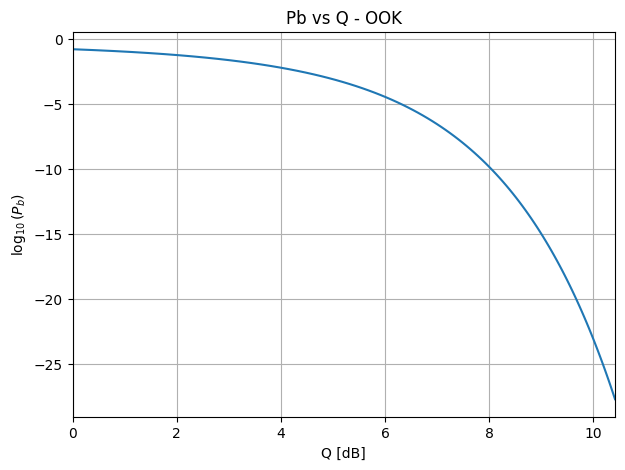

In [16]:
Q  = np.arange(1, 11.1, 0.1)

QdB = 10*np.log10(Q)

Pb = 0.5*erfc(Q/np.sqrt(2))

plt.figure(figsize=(7,5))
plt.plot(QdB, np.log10(Pb),label='Pb')
plt.title('Pb vs Q - OOK')
plt.xlabel('Q [dB]')
plt.ylabel('$\log_{10}(P_b)$');
plt.xlim(min(QdB),max(QdB))
plt.grid()

#### Example: simulation 10G OOK

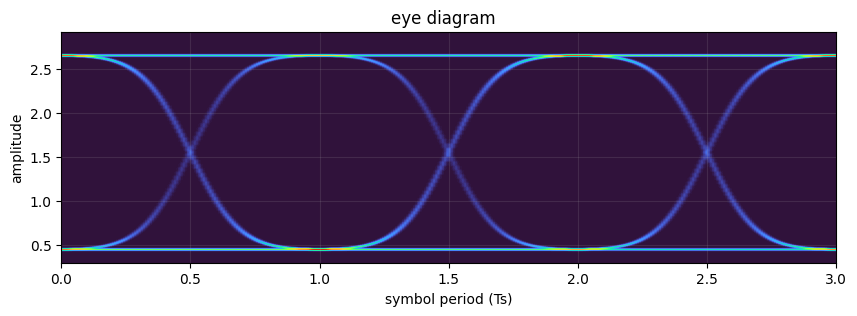

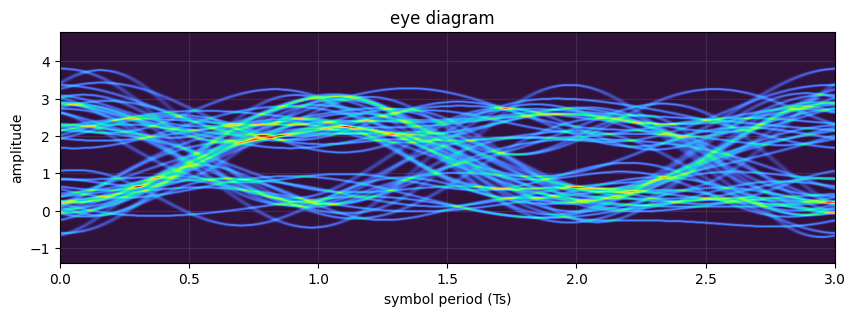

Pin[Rx] = -21.02 dBm 
SNR[sim] = 7.51 dB 

Parâmetros do diagrama de olho:
I0 = 0.33  
I1 = 2.55  
σ0 = 0.39  
σ1 = 0.39  
Limiar ótimo Id = 1.44  
Q = 2.82   

Total de erros contados = 259  
BER = 2.60e-03  
Pb = 2.37e-03  


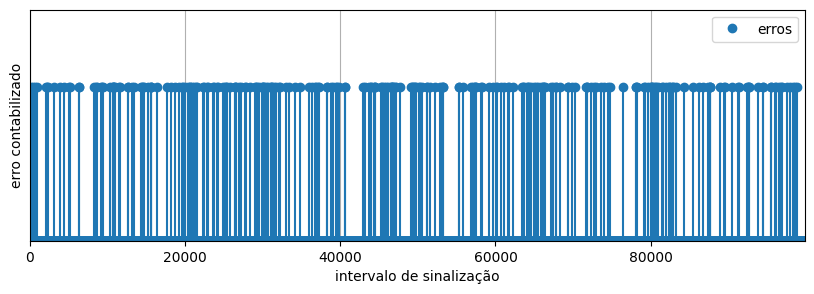

In [20]:
# parameters of the simulation
SpS    = 16         # number de amostras por símbolo
Rs     = 10e9       # Symbol rate (para o caso do OOK Rs = Rb)
Ts     = 1/Rs       # Período de símbolo em segundos
Fa     = 1/(Ts/SpS) # Frequency de amostragem do signal (amostras/second)
Ta     = 1/Fa       # Período de amostragem

Pi_dBm = -18  # power de signal optical na input do modulador em dBm

# parameters of the MZM
Vπ = 2
Vb = -Vπ/2
Pi = 10**(Pi_dBm/10)*1e-3 # power de signal optical em W na input do MZM

# parameters of the receiver
Tc  = 25    # temperatura em Celsius
Rd  = 0.85  # responsividade em A/W
Id  = 5e-9  # corrente de escuro em nA
RL  = 50    # RL em Ohms
B   = 10e9   # banda do receiver em Hz

############# Simulation #############

### Transmitter

# gera sequência de bits pseudo-aleatórios
bitsTx   = np.random.randint(2, size=100000)    
n        = np.arange(0, bitsTx.size)

# mapeia bits para pulsos elétricos
symbTx = 2*bitsTx-1
symbTx = symbTx/np.sqrt(signal_power(symbTx))

# upsampling
symbolsUp = upsample(symbTx, SpS)

# pulso
pulse = pulseShape('nrz', SpS)
#pulse = pulseShape('rrc', SpS, alpha=0.001, N = 2048)
pulse = pulse/max(abs(pulse))

# formatação de pulso
sigTx  = firFilter(pulse, symbolsUp)

# modulation optical
Ai     = np.sqrt(Pi)
sigTxo = mzm(Ai, 0.5*sigTx, Vπ, Vb)

### Receiver
Pin = (np.abs(sigTxo)**2).mean() # Power optical média média recebida

# detecta o signal com o fotodiodo pin (model implementado no OptiCommPy)
paramPD = parameters()
paramPD.R = Rd         # responsividade em A/W
paramPD.Tc = Tc       # temperatura em Celsius
paramPD.Id = Id       # corrente de escuro em A
paramPD.RL = RL       # RL em Ohms
paramPD.B = B         # Largura de banda Hz
paramPD.Fs = Fa 
paramPD.ideal = False

I_Rx = photodiode(sigTxo, paramPD)
I_Rx = I_Rx/np.std(I_Rx)

############ calculando a SNR na simulation

# noise de disparo 
σ2_s = 2*q*(Rd*Pin + Id)*B  # variância  

# noise térmico
T = Tc + 273.15     # temperatura em Kelvin
σ2_T = 4*kB*T*B/RL  # variância do noise térmico

# fotocorrente livre de noise
Ip = Rd*np.abs(sigTxo)**2

# noise do receiver p-i-n aos signals
Is   = normal(0, np.sqrt(Fa*(σ2_s/(2*B))), Ip.size)
It   = normal(0, np.sqrt(Fa*(σ2_T/(2*B))), Ip.size)  

# filtragem Rx
N = 8001
h = lowPassFIR(B, Fa, N, typeF='rect')
#h = pulseShape('nrz', SpS)

Ip_Rx  = firFilter(h, Ip)
Is_Rx  = firFilter(h, Is)
It_Rx  = firFilter(h, It)

# SNR estimada numericamente na simulation
SNR_est = np.var(Ip_Rx)/(np.var(Is_Rx) + np.var(It_Rx))

################################################

# gera signal para visualização do diagram de olho
I_eye = I_Rx[100*SpS:I_Rx.size-100*SpS]

eyediagram(Ip/np.std(Ip),  Ip.size-SpS, SpS, ptype='fancy')
eyediagram(I_eye/np.std(I_eye), I_eye.size-SpS, SpS, ptype='fancy')

print('Pin[Rx] = %.2f dBm '%(10*np.log10(Pin/1e-3)))
print('SNR[sim] = %.2f dB \n'%(10*np.log10(SNR_est)))

# captura amostras no meio dos intervalos de sinalização
I_Rx  = I_Rx[0::SpS]

# obtém estatísticas do signal recebido

I1 = np.mean(I_Rx[bitsTx==1]) # value average de I1
I0 = np.mean(I_Rx[bitsTx==0]) # value average de I0

σ1 = np.std(I_Rx[bitsTx==1]) # desvio padrão σ1 de I1 
σ0 = np.std(I_Rx[bitsTx==0]) # desvio padrão σ0 de I0 

Id = (σ1*I0 + σ0*I1)/(σ1 + σ0) # limiar de decisão ótimo
Q  = (I1-I0)/(σ1 + σ0)         # fator Q

print('Parâmetros do diagrama de olho:')
print('I0 = %.2f  '%(I0))
print('I1 = %.2f  '%(I1))
print('σ0 = %.2f  '%(σ0))
print('σ1 = %.2f  '%(σ1))
print('Limiar ótimo Id = %.2f  '%(Id))
print('Q = %.2f   \n'%(Q))

# Aplica a regra de decisão ótima
bitsRx = np.empty(bitsTx.size)
bitsRx[I_Rx>  Id] = 1
bitsRx[I_Rx<= Id] = 0

discard = 100
err = np.logical_xor(bitsRx[discard:bitsRx.size-discard], bitsTx[discard:bitsTx.size-discard])
BER = np.mean(err)

Pb = 0.5*erfc(Q/np.sqrt(2)) # probabilidade de erro teórica
print('Total de erros contados = %d  '%(err.sum()))
print('BER = %.2e  '%(BER))
print('Pb = %.2e  '%(Pb))


plt.plot(err,'o', label = 'erros')
plt.vlines(np.where(err>0), 0, 1)
plt.xlabel('intervalo de sinalização')
plt.ylabel('erro contabilizado')
plt.legend()
plt.grid()
plt.ylim(0, 1.5)
plt.xlim(0,err.size);
plt.yticks([]);  # Disable yticks.

In [18]:
from utils import genSignalGIF

In [30]:
from IPython.display import Image

I_Rx = photodiode(sigTxo, paramPD)
I_Rx = I_Rx/np.std(I_Rx)

t = np.arange(len(Ip_Rx[0:2048]))

figName1  = './figuras/sig.gif'
figName2  = './figuras/sigNoisy.gif'

windowSize = 256

genSignalGIF(t, Ip_Rx[0:2048], windowSize, figName1, fram=128, inter=80)
genSignalGIF(t, I_Rx[0:2048], windowSize, figName2, fram=128, inter=80)

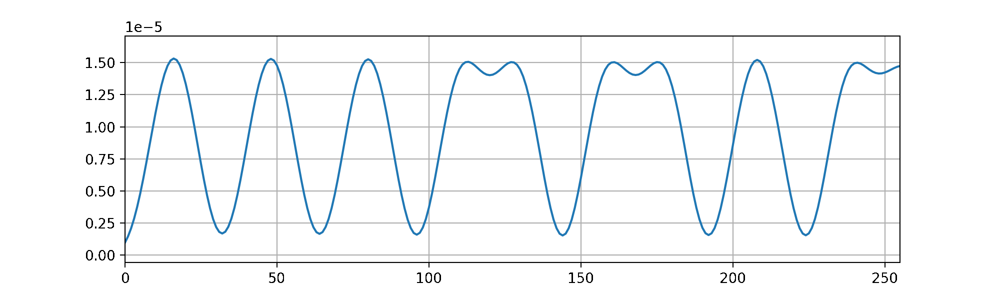

In [31]:
Image('./figuras/sig.gif', width=500)

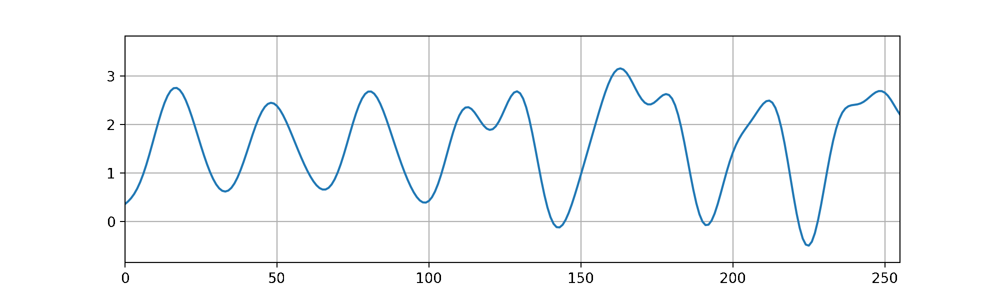

In [32]:
Image('./figuras/sigNoisy.gif', width=500)